# Research Articles SaS-CoV2 - Covid19

# Descrição

- Desde que o bloqueio foi anunciado no país em março, começamos com um hackathon de 1 dia chamado Janatahack inspirado no Janata cerfew para iniciar nossa guerra contra a pandemia. Observando a incrível resposta e a demanda por mais, continuamos os hackathons nos finais de semana todas as semanas. Janatahack hoje é um fenômeno em que muitos membros estimados de nossa comunidade participam regularmente para mostrar suas habilidades de aprendizado de máquina compartilhando suas abordagens e, mais importante, aprender como aplicar aprendizado de máquina e análise preditiva a novos domínios, como agricultura, bancos, IOT, previsão e assim por diante. Desta vez, trazemos para você hackathon, desta vez uma extravagância de 10 dias com lançamento no dia da independência da Índia, 15 de agosto de 2020. Aberto a todos os profissionais de dados, iniciantes em ciência de dados e cientistas de dados. Registre-se hoje para testar suas habilidades e ganhar Pontos AV. O tema para este hackathon será lançado no dia da independência junto com a declaração do problema e o conjunto de dados. Portanto, fique atento e inscreva-se hoje para receber todas as atualizações sobre este evento emocionante.

# Introdução

- Os pesquisadores têm acesso a grandes arquivos online de artigos científicos. Como consequência, encontrar artigos relevantes tornou-se mais difícil. A marcação ou modelagem de tópicos fornece uma maneira de fornecer token de identificação para artigos de pesquisa, o que facilita o processo de recomendação e pesquisa. Dado o resumo e o título de um conjunto de artigos de pesquisa, preveja os tópicos para cada artigo incluído no conjunto de teste. Observe que um artigo de pesquisa pode ter mais de 1 tópico. 

- Os resumos e títulos dos artigos de pesquisa são provenientes dos 6 tópicos a seguir:

**Ciência da Computação**

**Física**

**Matemática**

**Estatisticas**

**Biologia Quantitativa**

**Finança quantitativa**

**Dataset**

Artigos de pesquisa: [Dataset](https://www.kaggle.com/blessondensil294/topic-modeling-for-research-articles)

In [1]:
# Versão do python

from platform import python_version
print('Versão python neste Jupyter Notebook:', python_version())

Versão python neste Jupyter Notebook: 3.8.8


In [2]:
# Importação das bibliotecas 

import pandas as pd # Pandas carregamento csv
import numpy as np # Numpy para carregamento cálculos em arrays multidimensionais

# Visualização de dados
import seaborn as sns
import matplotlib as m
import matplotlib as mpl
import matplotlib.pyplot as plt
import plotly
import plotly.express as px
import plotly.graph_objects as go

from bokeh.plotting import figure, output_file, show
from bokeh.models import Label
from bokeh.io import output_notebook
output_notebook()

# Carregar as versões das bibliotecas
import watermark

# Warnings retirar alertas 
import warnings
warnings.filterwarnings("ignore")

Loading BokehJS ...

In [3]:
# NLTK para NLP
import nltk
import re

from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.sentiment.vader import SentimentIntensityAnalyzer

nltk.download('vader_lexicon')
nltk.download("stopwords")
nltk.download('punkt')

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\Administrador\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Administrador\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Administrador\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [4]:
# Versões das bibliotecas

%reload_ext watermark
%watermark -a "Versões das bibliotecas" --iversions

Author: Versões das bibliotecas

seaborn   : 0.11.1
plotly    : 5.6.0
matplotlib: 3.3.4
re        : 2.2.1
nltk      : 3.6.1
pandas    : 1.2.4
watermark : 2.3.0
numpy     : 1.20.1



In [5]:
# Configuração para os gráficos largura e layout dos graficos

plt.style.use('seaborn-darkgrid')
sns.set_style("whitegrid")

In [6]:
# Carregando a base de dados
df_train = pd.read_csv("train.csv")
df_test = pd.read_csv("test.csv")

In [7]:
df_train

,ID,TITLE,ABSTRACT,Computer Science,Physics,Mathematics,Statistics,Quantitative Biology,Quantitative Finance
0,1,Reconstructing Subject-Specific Effect Maps,Predictive models allow subject-specific inf...,1,0,0,0,0,0
1,2,Rotation Invariance Neural Network,Rotation invariance and translation invarian...,1,0,0,0,0,0
2,3,Spherical polyharmonics and Poisson kernels fo...,We introduce and develop the notion of spher...,0,0,1,0,0,0
3,4,A finite element approximation for the stochas...,The stochastic Landau--Lifshitz--Gilbert (LL...,0,0,1,0,0,0
4,5,Comparative study of Discrete Wavelet Transfor...,Fourier-transform infra-red (FTIR) spectra o...,1,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...
20967,20968,Contemporary machine learning: a guide for pra...,Machine learning is finding increasingly bro...,1,1,0,0,0,0
20968,20969,Uniform diamond coatings on WC-Co hard alloy c...,Polycrystalline diamond coatings have been g...,0,1,0,0,0,0
20969,20970,Analysing Soccer Games with Clustering and Con...,We present a new approach for identifying si...,1,0,0,0,0,0
20970,20971,On the Efficient Simulation of the Left-Tail o...,The sum of Log-normal variates is encountere...,0,0,1,1,0,0


In [8]:
# Número de linhas e colunas
df_train.shape

(20972, 9)

In [9]:
# Verificando informações das variaveis
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20972 entries, 0 to 20971
Data columns (total 9 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   ID                    20972 non-null  int64 
 1   TITLE                 20972 non-null  object
 2   ABSTRACT              20972 non-null  object
 3   Computer Science      20972 non-null  int64 
 4   Physics               20972 non-null  int64 
 5   Mathematics           20972 non-null  int64 
 6   Statistics            20972 non-null  int64 
 7   Quantitative Biology  20972 non-null  int64 
 8   Quantitative Finance  20972 non-null  int64 
dtypes: int64(7), object(2)
memory usage: 1.4+ MB


In [10]:
# Tipo dos dados
df_train.dtypes

ID                       int64
TITLE                   object
ABSTRACT                object
Computer Science         int64
Physics                  int64
Mathematics              int64
Statistics               int64
Quantitative Biology     int64
Quantitative Finance     int64
dtype: object

In [11]:
# Total de colunas e linhas 

print("Números de linhas: {}" .format(df_train.shape[0]))
print("Números de colunas: {}" .format(df_train.shape[1]))

Números de linhas: 20972
Números de colunas: 9


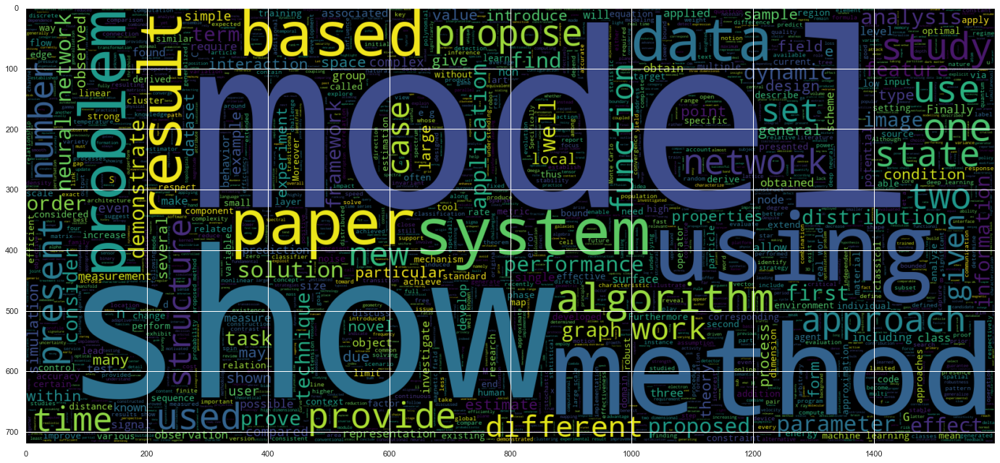

In [17]:
import warnings   
from wordcloud import WordCloud
from termcolor import cprint

plt.figure(figsize=(24,20))

world_cloud_postive=WordCloud(min_font_size=3,max_words=3200,width=1600,height=720).generate("".join(df_train.ABSTRACT))
plt.imshow(world_cloud_postive,interpolation='bilinear')

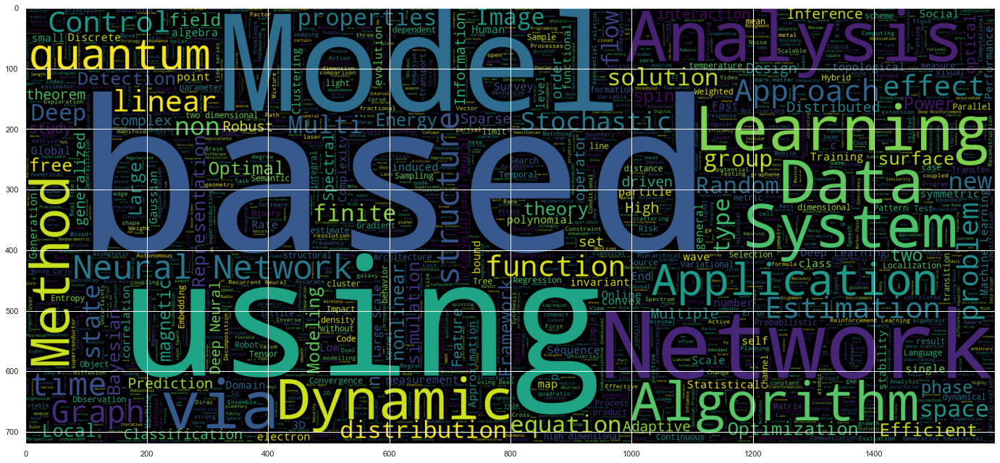

In [18]:
plt.figure(figsize=(24,20))

world_cloud_postive=WordCloud(min_font_size=3,max_words=3200,width=1600,height=720).generate("".join(df_train.TITLE))
plt.imshow(world_cloud_postive,interpolation='bilinear')

# Pré - processamento

In [19]:
colunas = df_train.columns
colunas

Index(['ID', 'TITLE', 'ABSTRACT', 'Computer Science', 'Physics', 'Mathematics',
       'Statistics', 'Quantitative Biology', 'Quantitative Finance'],
      dtype='object')

In [20]:
pd.set_option('display.max_colwidth', 100)
df_train.head()

,ID,TITLE,ABSTRACT,Computer Science,Physics,Mathematics,Statistics,Quantitative Biology,Quantitative Finance
0,1,Reconstructing Subject-Specific Effect Maps,Predictive models allow subject-specific inference when analyzing disease\nrelated alterations...,1,0,0,0,0,0
1,2,Rotation Invariance Neural Network,Rotation invariance and translation invariance have great values in image\nrecognition tasks. ...,1,0,0,0,0,0
2,3,Spherical polyharmonics and Poisson kernels for polyharmonic functions,"We introduce and develop the notion of spherical polyharmonics, which are a\nnatural generalis...",0,0,1,0,0,0
3,4,A finite element approximation for the stochastic Maxwell--Landau--Lifshitz--Gilbert system,The stochastic Landau--Lifshitz--Gilbert (LLG) equation coupled with the\nMaxwell equations (t...,0,0,1,0,0,0
4,5,Comparative study of Discrete Wavelet Transforms and Wavelet Tensor Train decomposition to featu...,Fourier-transform infra-red (FTIR) spectra of samples from 7 plant species\nwere used to explo...,1,0,0,1,0,0


# Tfidf Vectorizer

In [21]:
from sklearn.feature_extraction.text import TfidfVectorizer
dataset_texts = df_train['ABSTRACT'].tolist()

In [24]:
2**12

tfidf = TfidfVectorizer(max_features=2**12)
vectorized = tfidf.fit_transform(dataset_texts)
vectorized.shape

(20972, 4096)

# PCA - Redução de dimensionalidade

In [25]:
from sklearn.decomposition import PCA

pca = PCA(n_components = 2)
X_pca = pca.fit_transform(vectorized.toarray())

In [26]:
components = pca.explained_variance_ratio_
components

array([0.00880576, 0.00775985])

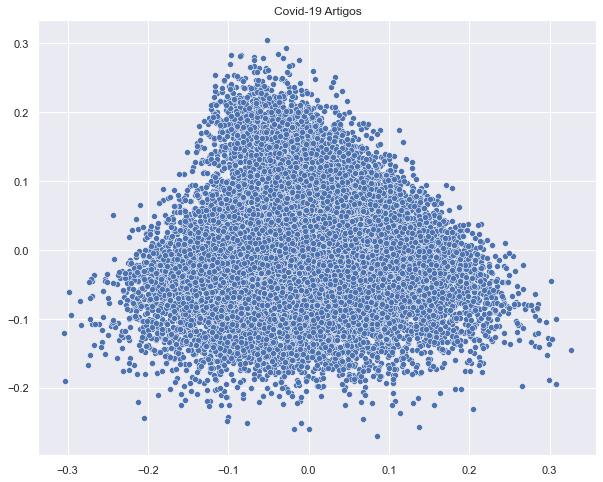

In [27]:
sns.set(rc={'figure.figsize': (10,8)})
sns.scatterplot(X_pca[:,0], X_pca[:, 1])
plt.title('Covid-19 Artigos');

# Clusters

Text(0, 0.5, 'WCSS')

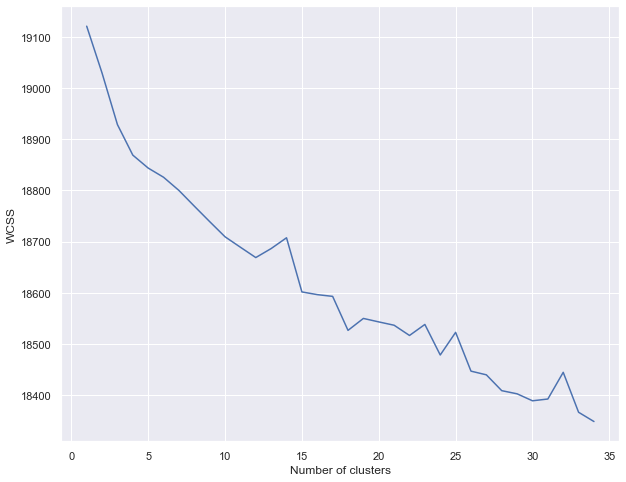

In [28]:
from sklearn.cluster import MiniBatchKMeans

wcss = []

for i in range(1, 35):
    kmeans = MiniBatchKMeans(n_clusters = i, random_state = 0)
    kmeans.fit(vectorized)
    wcss.append(kmeans.inertia_)

plt.plot(range(1, 35), wcss)
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')

# Modelo k-means

In [29]:
from sklearn.cluster import KMeans

k = 20

kmeans = MiniBatchKMeans(n_clusters=k)
y_pred = kmeans.fit_predict(vectorized)

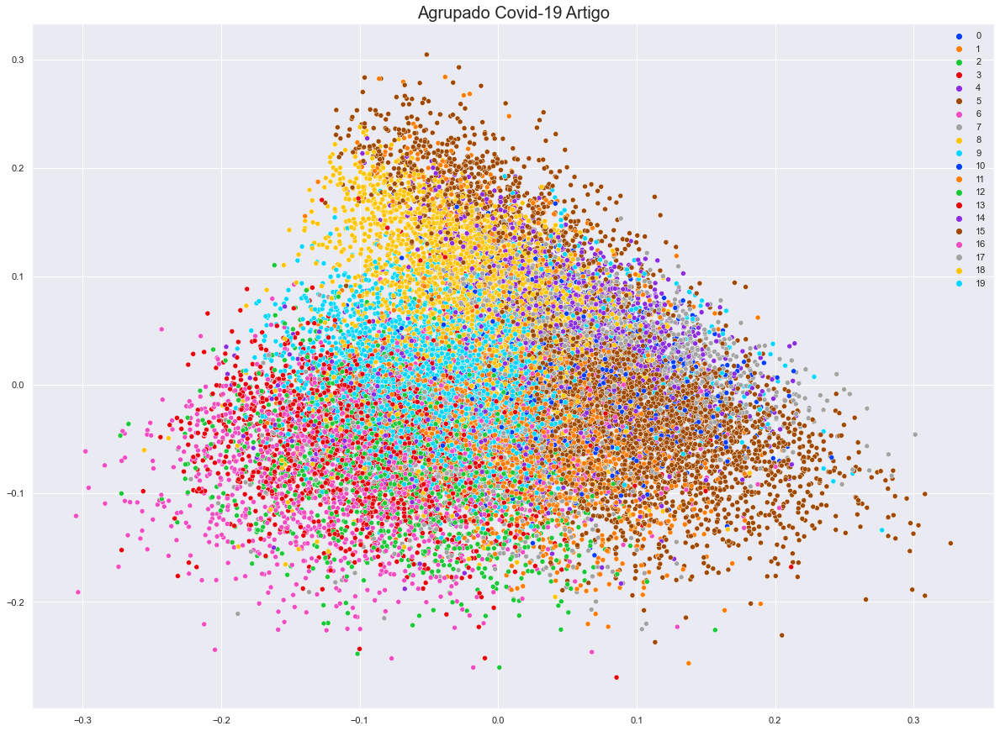

In [30]:
plt.figure(figsize=(20.5, 15))

palette = sns.color_palette('bright', len(set(y_pred)))
sns.scatterplot(X_pca[:,0], X_pca[:, 1], hue=y_pred, legend='full', palette=palette)
plt.title('Agrupado Covid-19 Artigo', fontsize=20);

# Modelo K-Means - 02

In [31]:
agrupador = KMeans(n_clusters = 25)
agrupador.fit(vectorized)
labels = agrupador.labels_

print("Grupo - 1", labels)
print("\n")

agrupador.fit(vectorized)
labels = agrupador.labels_

print("Grupo - 2", labels)

Grupo - 1 [ 2 18 15 ... 18 11 16]


Grupo - 2 [13  2 18 ... 20 23 19]


In [32]:
fig = go.Figure()

fig.add_trace(go.Scatter(x = X_pca[:,0],
                         y = X_pca[:, 1], mode = 'markers',                      
                          marker = dict(color = agrupador.labels_.astype(np.float)),
                        text = labels))

fig.show()

# Silhouette

In [33]:
from sklearn.metrics import silhouette_samples, silhouette_score

faixa_n_clusters = [i for i in range(2,10)]
valores_silhueta = []
print(faixa_n_clusters)

[2, 3, 4, 5, 6, 7, 8, 9]


In [35]:
wcc = []

for K in faixa_n_clusters:
    agrupador = KMeans(n_clusters = K, random_state=25)
    labels = agrupador.fit_predict(vectorized)
    media_silhueta = silhouette_score(vectorized, labels)
    valores_silhueta.append(media_silhueta)
    print(K)
    print(valores_silhueta)

2
[0.005854156627557971]
3
[0.005854156627557971, 0.00412115592192101]
4
[0.005854156627557971, 0.00412115592192101, 0.00091977846385451]
5
[0.005854156627557971, 0.00412115592192101, 0.00091977846385451, 0.0005231185420660045]
6
[0.005854156627557971, 0.00412115592192101, 0.00091977846385451, 0.0005231185420660045, -0.0006834484395892318]
7
[0.005854156627557971, 0.00412115592192101, 0.00091977846385451, 0.0005231185420660045, -0.0006834484395892318, 0.00017025178683572172]
8
[0.005854156627557971, 0.00412115592192101, 0.00091977846385451, 0.0005231185420660045, -0.0006834484395892318, 0.00017025178683572172, 0.0004183848342261524]
9
[0.005854156627557971, 0.00412115592192101, 0.00091977846385451, 0.0005231185420660045, -0.0006834484395892318, 0.00017025178683572172, 0.0004183848342261524, 0.0013026056852727624]


In [36]:
faixa_quantil = np.linspace(0.02, 0.5, 15)
faixa_quantil

array([0.02      , 0.05428571, 0.08857143, 0.12285714, 0.15714286,
       0.19142857, 0.22571429, 0.26      , 0.29428571, 0.32857143,
       0.36285714, 0.39714286, 0.43142857, 0.46571429, 0.5       ])

In [44]:
print("O coeficiente de silhueta do K-means é: ", silhouette_score(vectorized, labels))

O coeficiente de silhueta do K-means é:  0.0013026056852727624
